In [10]:
from skimage import morphology
import numpy as np
import nibabel as nib
from matplotlib.colors import LinearSegmentedColormap
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('white')

%matplotlib inline

In [11]:
#Created by Drew Fox
#Be sure to include Drew on the manuscript if you use this code
def create_overlay_img( image_list, threshold_list, cmap_list, ax, slice_num = 87, dim=1, alpha_list=None, 
                       outline_list=None, mask_file=None, center_cmap_list=None, upsample_list=None,
                      immin_list=None, immax_list=None):
    
    if not alpha_list:
        alpha_list = np.ones(((len(image_list))))
    if not center_cmap_list:
        center_cmap_list = [False] * len(image_list)
    if not upsample_list:
        upsample_list = [True] + [False] * (len(image_list)-1)
    if not immin_list:
        immin_list = [False] * (len(image_list))
    if not immax_list:
        immax_list = [False] * (len(image_list))
#     print (immin_list, immax_list)
    #  print (upsample_list)
        
    def get_cmap(this_cmap):
        if type(this_cmap)==str:
            import copy
            this_cmap = copy.copy(plt.cm.get_cmap(this_cmap))
        else:
            l = list()
            l = [s for s in this_cmap]
            this_cmap = LinearSegmentedColormap.from_list('this_cmap', l)

        this_cmap.set_bad(alpha=0)
        return this_cmap
        
    ax.set_axis_off()

    # mask image
    if mask_file:
        mask = nib.load( mask_file, mmap=False )
        mask_data = mask.get_data()

    for i, img in enumerate(image_list):
        # for each image in the input list
        this_img = nib.load(img, mmap=False)
        img_data = this_img.get_data()

        if mask_file:
            img_data[mask_data==0] = np.nan

        # find the right slice to draw
        if dim==1:
            toDraw = img_data[:,slice_num,:];
        elif dim==2:
            toDraw = img_data[slice_num,:,:];
        elif dim==3:
            toDraw = img_data[:,:,slice_num];
        # orient appropriately?
        toDraw=np.rot90(toDraw)
        toDraw=np.fliplr(toDraw)
        
        if i==0:
            this_extent = 0, toDraw.shape[1], 0, toDraw.shape[0]

        this_cmap = get_cmap(cmap_list[i])
        this_threshold = threshold_list[i]
        this_alpha = alpha_list[i]

        if upsample_list:
            if upsample_list[i]:
                from scipy.ndimage.interpolation import zoom
                toDraw[ np.isnan(toDraw)] = 0
                toDraw = zoom(toDraw, 5.0, order=2, mode='reflect')
        
        # threshold the image
        toDraw[abs(toDraw)<this_threshold]=np.nan
        
        immin = immin_list[i]
        immax = immax_list[i]
        if immax==None:
            immax = np.nanmax(toDraw)
        if immin==None:
            immin = np.nanmin(np.nanmin(toDraw),0)

        # center colormap
        if center_cmap_list[i]:
            immin = -1*max(abs(immin),abs(immax))
            immax = max(abs(immin),abs(immax))
        
        
        # show the image 
        im = ax.imshow(toDraw, cmap = this_cmap, interpolation='nearest', alpha=this_alpha, 
                       vmin=immin, vmax=immax, extent=this_extent)

        if outline_list:
            if outline_list[i]:
                this_cmap = get_cmap(outline_list[i])
#                 print this_cmap
                toDraw_line = np.zeros(toDraw.shape)
                toDraw_line[ np.isnan(toDraw)==False ] = 1

                toDraw_line = morphology.dilation(toDraw_line, selem=morphology.disk(1))
                toDraw_line[ np.isnan(toDraw)==False ] = 0
                toDraw_line[ toDraw_line == 0 ] = np.nan
                im = ax.imshow(toDraw_line, cmap = this_cmap, interpolation='nearest', extent=this_extent)

        # not sure if this helps...
        this_img  = []
        mask = []
            

    # write to the pipe...
    #     plt.savefig(p.stdin, format='png', facecolor=fig.get_facecolor(), edgecolor='none', dpi=(80) )



def my_palplot(pal, ax):
    """ RIPPED FROM SEBORN, so that I could plot in in a subplot
    Plot the values in a color palette as a horizontal array.
    Parameters
    ----------
    pal : sequence of matplotlib colors
        colors, i.e. as returned by seaborn.color_palette()
    size :
        scaling factor for size of plot
    """
    n = len(pal)
#     f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n))
    ax.set_yticks([-.5, .5])
    ax.grid(False)
    ax.set_xticklabels([str(x) for x in np.arange(1,n+1)])
    ax.set_yticklabels([])
    

    
# f, axarr = plt.subplots(2,1)
# my_palplot(sns.diverging_palette(10, 220, sep=80, n=7), ax=axarr[0])


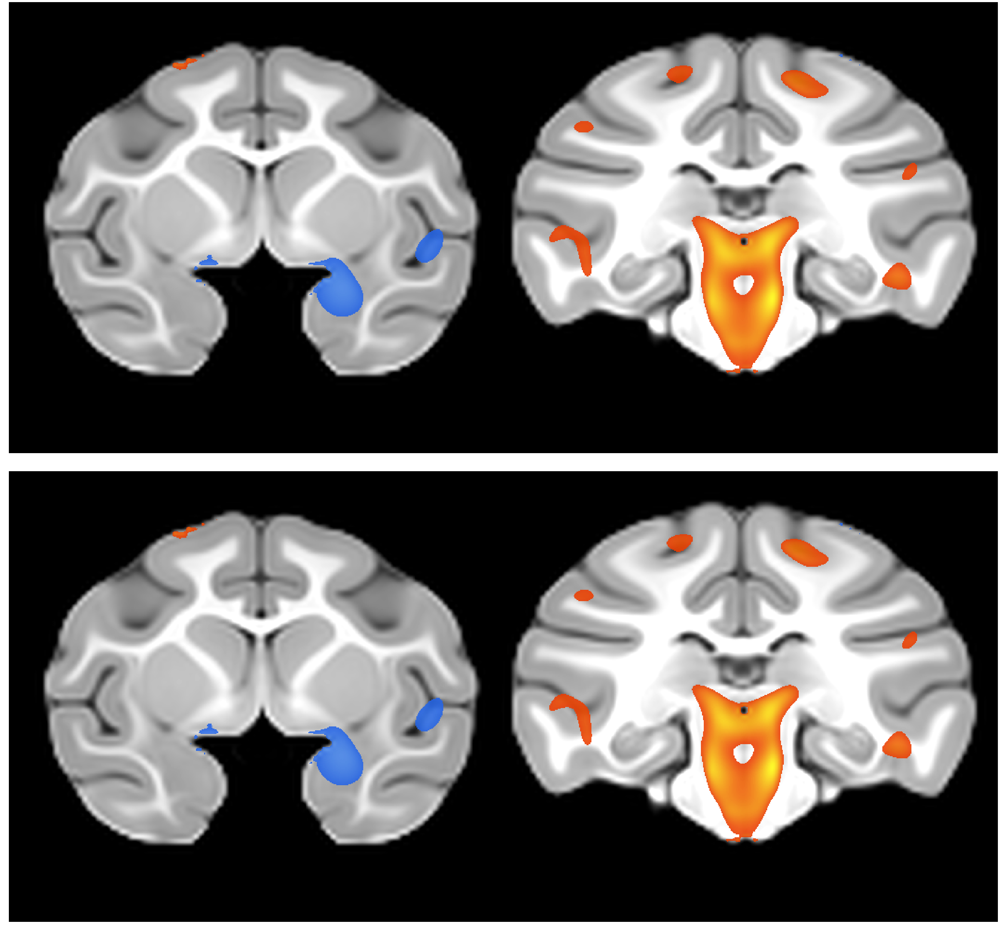

In [6]:
#This cell is test code
image_list1=["t1.nii", "NifTI/NOMOM_randomise_DTI_jac_tstat1.nii.gz"]
image_list2=["t1.nii", "NifTI/NOMOM_randomise_DTI_AD_tstat1.nii.gz"]

threshold_list=[0, 2.9488]
#threshold_list=[0.95, 2.9488]
cmap_list=["gray", "RdYlBu"]

colors = ["light blue","blue", "red","yellow"]
cmap_do = sns.xkcd_palette(colors)


f,axarr=plt.subplots(2,2,figsize=(50,50))
plt.subplots_adjust(wspace=-0.05, hspace=-0.05)

create_overlay_img( image_list1, threshold_list, cmap_list=["gray",cmap_do], ax=axarr[0,0], slice_num = 93, dim=1, alpha_list=[1,0.9], 
                       outline_list=None, mask_file=None, center_cmap_list=[False,True], immin_list=[0,-6], immax_list=[4.8,5], upsample_list=[True,True])

create_overlay_img( image_list2, threshold_list, cmap_list=["gray",cmap_do], ax=axarr[0,1], slice_num = 66, dim=1, alpha_list=[1,0.9], 
                       outline_list=None, mask_file=None, center_cmap_list=[False,True], immin_list=[0,-6], immax_list=[4.8,6], upsample_list=[True,True])

create_overlay_img( image_list1, threshold_list, cmap_list=["gray",cmap_do], ax=axarr[1,0], slice_num = 93, dim=1, alpha_list=[1,0.9], 
                       outline_list=None, mask_file=None, center_cmap_list=[False,True], immin_list=[0,-6], immax_list=[4.8,5], upsample_list=[True,True])

create_overlay_img( image_list2, threshold_list, cmap_list=["gray",cmap_do], ax=axarr[1,1], slice_num = 66, dim=1, alpha_list=[1,0.9], 
                       outline_list=None, mask_file=None, center_cmap_list=[False,True], immin_list=[0,-6], immax_list=[4.8,6], upsample_list=[True,True])



#colors = ["pink", 'forrest green', "hot pink"]
#cmap_do = sns.xkcd_palette(colors)

#colors = ["red", "blue"]
#cmap_do = sns.xkcd_palette(colors)

#create_overlay_img( image_list, threshold_list, cmap_list=["gray",cmap_do], ax=axarr[1,1], slice_num = 100, dim=1, alpha_list=[1,0.5], 
 #                      outline_list=[False,False], mask_file="t1_mask.nii.gz", center_cmap_list=[False,True], immin_list=[0,None], immax_list=[4.8,None], upsample_list=[True,False])

#Colorbar + Location
#ax1b = f.add_axes([0.9, 0.1, .33, .05])
#my_palplot(cmap_do, ax=ax1b)






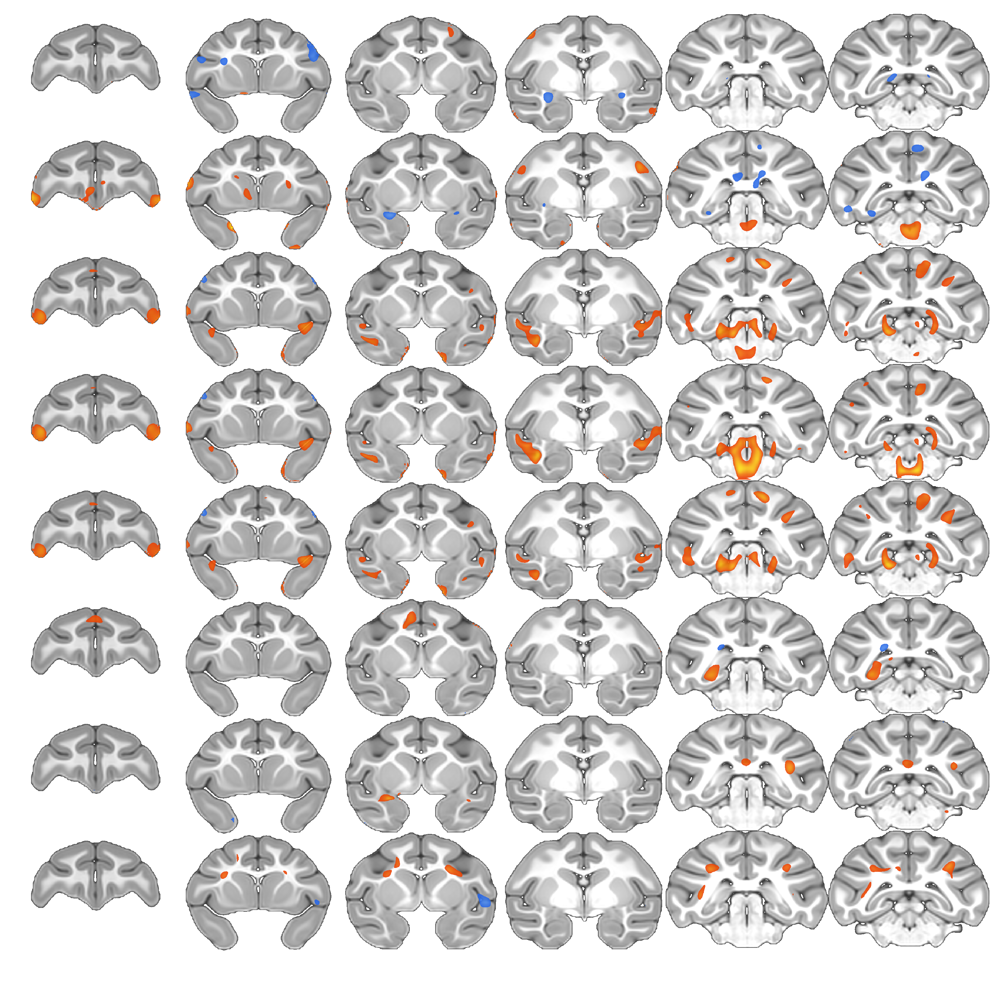

In [17]:
#This cell Creates the Full Figure
image_list=[ ["t1.nii", "NifTI/NOMOM_randomise_T1-jac_tstat1.nii.gz"],
#["t1.nii", "NifTI/NOMOM_randomise_DTI_jac_tstat1.nii.gz"],
["t1.nii", "NifTI/NOMOM_randomise_DTI_FA_tstat1.nii.gz"],
["t1.nii", "NifTI/NOMOM_randomise_DTI_MD_tstat1.nii.gz"],
["t1.nii", "NifTI/NOMOM_randomise_DTI_AD_tstat1.nii.gz"],
["t1.nii", "NifTI/NOMOM_randomise_DTI_RD_tstat1.nii.gz"],
["t1.nii", "NifTI/NOMOM_randomise_rs-fMRI_postCing_tstat1.nii.gz"],
["t1.nii", "NifTI/NOMOM_randomise_rs-fMRI_bilateral_tstat1.nii.gz"],
["t1.nii", "NifTI/NOMOM_randomise_pet_tstat1.nii.gz"]]

threshold_list=[0.95, 2.9488]

#cmap_list=["gray", "coolwarm"]
colors = ["light blue","blue", "red","yellow"]
cmap_do = sns.xkcd_palette(colors)

f,axarr=plt.subplots(8,6,figsize=(30,37))
plt.subplots_adjust(wspace=-0.08, hspace=-0.7)

slice_list = [111, 100, 93, 86, 62, 59]

for i, image_pair in enumerate(image_list):
    for j, each_slice in enumerate(slice_list):
        create_overlay_img( image_pair, threshold_list, cmap_list=["gray",cmap_do], ax=axarr[i,j], slice_num = each_slice, dim=1, alpha_list=[1,0.9], 
                       outline_list=None, mask_file=None, center_cmap_list=[False,True], immin_list=[0,-6], immax_list=[4.8,6], upsample_list=[True,True])
 #         break 
#    break

plt.savefig("../FIGS/NeuroImaging_test.pdf", dpi=300, bbox_inches='tight', transparent=True)

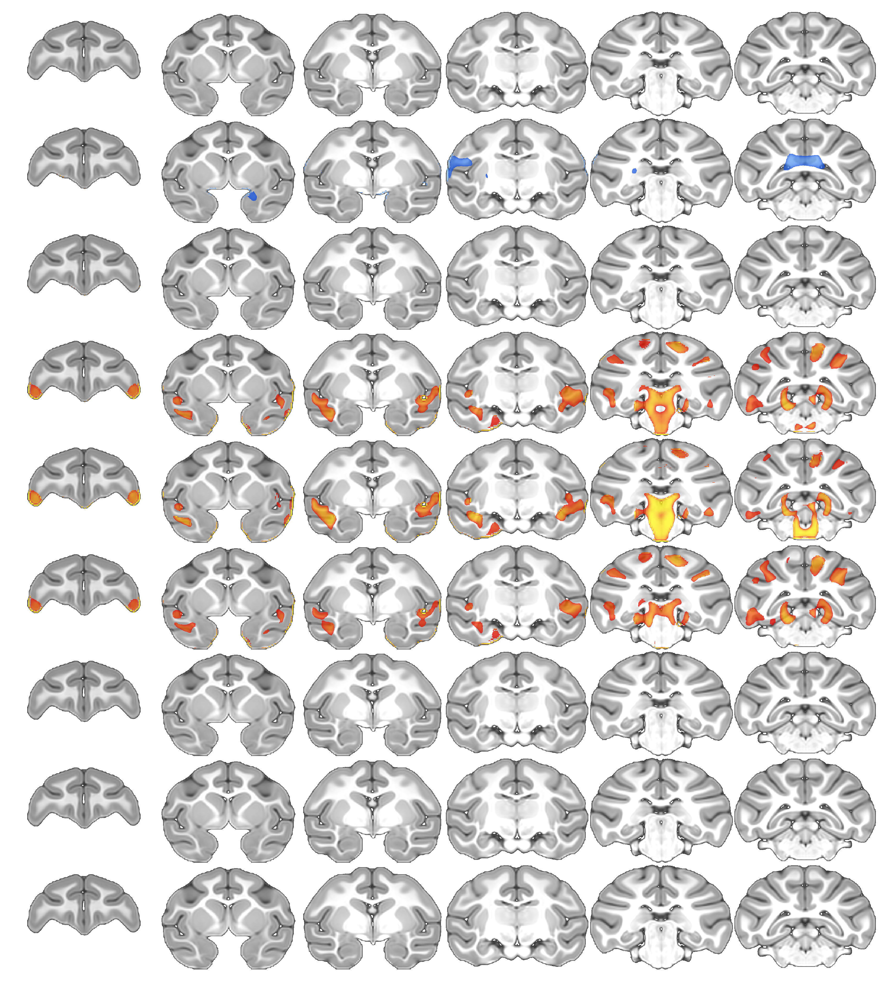

In [4]:
#Create Full Figure, TFCE
image_list=[ ["t1.nii", "NOMOM_randomise_T1-jac_tfce_corrp_tstat1.nii.gz", "NOMOM_randomise_T1-jac_tfce_corrp_tstat2.nii.gz"],
["t1.nii", "NOMOM_randomise_DTI_jac_tfce_corrp_tstat1.nii.gz", "NOMOM_randomise_DTI_jac_tfce_corrp_tstat2.nii.gz"],
["t1.nii", "NOMOM_randomise_DTI_FA_tfce_corrp_tstat1.nii.gz", "NOMOM_randomise_DTI_FA_tfce_corrp_tstat2.nii.gz"],
["t1.nii", "NOMOM_randomise_DTI_MD_tfce_corrp_tstat1.nii.gz", "NOMOM_randomise_DTI_MD_tfce_corrp_tstat2.nii.gz"],
["t1.nii", "NOMOM_randomise_DTI_AD_tfce_corrp_tstat1.nii.gz", "NOMOM_randomise_DTI_AD_tfce_corrp_tstat2.nii.gz"],
["t1.nii", "NOMOM_randomise_DTI_RD_tfce_corrp_tstat1.nii.gz", "NOMOM_randomise_DTI_RD_tfce_corrp_tstat2.nii.gz"],
["t1.nii", "NOMOM_randomise_rs-fMRI_L_tfce_corrp_tstat1.nii.gz", "NOMOM_randomise_rs-fMRI_L_tfce_corrp_tstat2.nii.gz"],
["t1.nii", "NOMOM_randomise_rs-fMRI_R_tfce_corrp_tstat1.nii.gz", "NOMOM_randomise_rs-fMRI_R_tfce_corrp_tstat2.nii.gz"],
["t1.nii", "NOMOM_randomise_pet_tfce_corrp_tstat1.nii.gz", "NOMOM_randomise_pet_tfce_corrp_tstat2.nii.gz"]]

threshold_list=[0.95, 0.95, 0.95]

#cmap_list=["gray", "coolwarm"]
#colors = ["light blue","blue", "red","yellow"]
colors2 = ["blue","light blue"]
colors = ["red","yellow"]
cmap_do = sns.xkcd_palette(colors)
cmap_do2 = sns.xkcd_palette(colors2)

f,axarr=plt.subplots(9,6,figsize=(60,75))
plt.subplots_adjust(wspace=-0.07, hspace=-0.5)

slice_list = [111, 93, 86, 77, 65, 59]

for i, image_pair in enumerate(image_list):
    for j, each_slice in enumerate(slice_list):
        create_overlay_img( image_pair, threshold_list, cmap_list=["gray",cmap_do,cmap_do2], ax=axarr[i,j], slice_num = each_slice, dim=1, alpha_list=[1,0.75,0.75], 
                       outline_list=None, mask_file=None, center_cmap_list=[False,False,False], immin_list=[0,0.95,0.95], immax_list=[4.8,1,1], upsample_list=[True,True,True])
 #         break 
#    break

plt.savefig("NeuroImaging_stats_tfce.pdf", dpi=300, bbox_inches='tight')

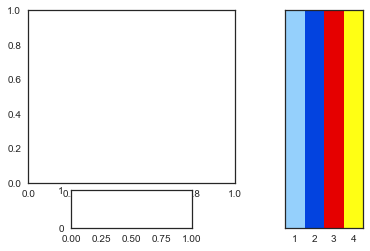

In [168]:
#test code
# floating axis
ax1 = plt.subplot2grid((5,8), (0,0), colspan=5, rowspan=4)
ax2 = plt.subplot2grid((5,8), (4,1), colspan=3, rowspan=1)
ax3 = plt.subplot2grid((5,8), (0,6), colspan=2, rowspan=5)

# floating axis
ax1b = f.add_axes([0.425, 0.725, .2, .2])


# a bunch of floating axes
ax1 = f.add_axes([0.2, 0.6, .4, .4], zorder=4)
ax2 = f.add_axes([0.3, 0.5, .4, .4], zorder=3)
#ax3 = f.add_axes([0.4, 0.4, .4, .4], zorder=2)
ax4 = f.add_axes([0.5, 0.3, .4, .4], zorder=1)

#Colorbar + Location
colors_cold = ["light blue","blue"]
colors_hot = ["red","yellow"]

cmap_do = sns.xkcd_palette(colors)
#ax1b = f.add_axes([0.9, 0.1, .33, .05])
my_palplot(cmap_do, ax=ax3)




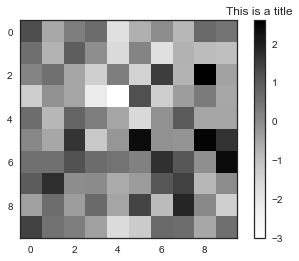

In [170]:
import numpy as np
import matplotlib.pylab as plt 

dat = np.random.randn(10,10)
plt.imshow(dat, interpolation='none')

clb = plt.colorbar()
clb.ax.set_title('This is a title')

plt.show()